In [1]:
import os
from glob import glob
import numpy as np
import xarray as xr
import pandas as pd
import geopandas as gpd
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import holoviews as hv

In [17]:
ts = 'adaptor.mars.internal-1646455031.5664723-26078-17-058da7a0-5295-445a-8503-0894f96d9fa6.nc'
temp = xr.open_dataset(ts, chunks='auto')

In [18]:
def ds_swaplon(ds):
    return ds.assign_coords(longitude=(((ds.longitude + 180) % 360) - 180)).sortby('longitude')

In [19]:
temp = ds_swaplon(temp)

In [20]:
temp['sst']-=273.15
temp['sst'].attrs['units'] = 'C'

In [24]:
polar_lat = 66.5
#arctic_idx = slice(polar_lat,90)
arctic_temp_idx = (temp['latitude'] >= polar_lat)
antarctic_temp_idx = (temp['latitude'] <= -polar_lat)
nonpolar_temp_idx = (temp['latitude'] < polar_lat) & (temp['latitude'] > -polar_lat)

arctic_temp = temp.where(arctic_temp_idx).mean(dim=('latitude', 'longitude'))
antarctic_temp = temp.where(antarctic_temp_idx).mean(dim=('latitude', 'longitude'))
nonpolar_temp = temp.where(nonpolar_temp_idx).mean(dim=('latitude', 'longitude'))
global_temp = temp.sst.mean(dim=('latitude', 'longitude'))


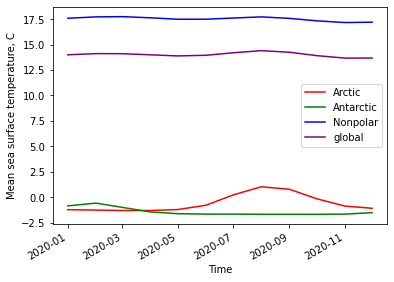

In [25]:

f, axs = plt.subplots()
arctic_temp.sst.plot(ax = axs, color='r', label = 'Arctic')
antarctic_temp.sst.plot(ax = axs, color='green', label = 'Antarctic')
nonpolar_temp.sst.plot(ax = axs, color='blue', label = 'Nonpolar')
global_temp.plot(ax = axs, color='purple', label = 'global')
axs.set_xlabel('Time')
axs.set_ylabel('Mean sea surface temperature, C')
plt.legend()

<Figure size 1800x1200 with 0 Axes>

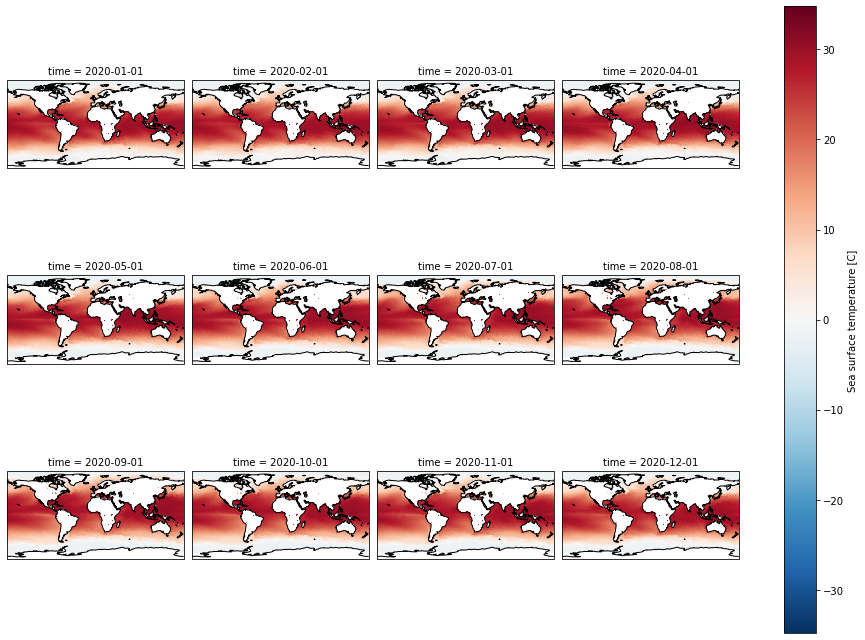

In [13]:
#proj = ccrs.PlateCarree()
f = plt.figure(dpi=300)
#ax = plt.axes(projection=ccrs.PlateCarree())
#ax.coastlines() 
#chlor_array['chlor_a'].sel(time='2020-01-01T00:00:00.000000000').plot.imshow(ax=ax, robust=True);
fg = temp['sst'].plot.imshow(x='longitude', y='latitude', col="time", col_wrap=4,subplot_kws=dict(projection=ccrs.PlateCarree()),transform=ccrs.PlateCarree())
for ax in fg.axes.flat:
    ax.size(20,5)
    ax.coastlines()

<Figure size 1800x1200 with 0 Axes>

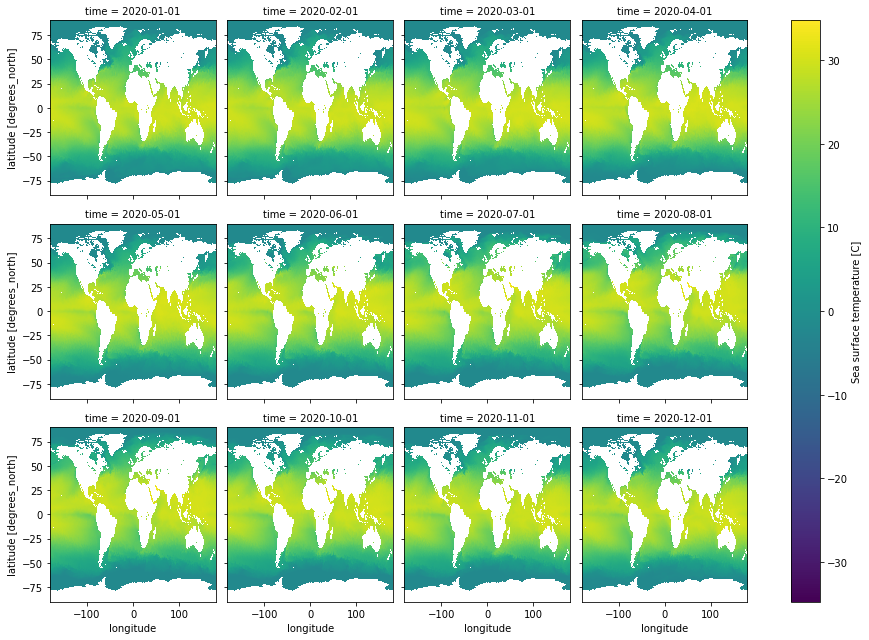

In [7]:
f = plt.figure(dpi=300)
#ax = plt.axes(projection=ccrs.PlateCarree())
#ax.coastlines() 
#chlor_array['chlor_a'].sel(time='2020-01-01T00:00:00.000000000').plot.imshow(ax=ax, robust=True);
temp_surface_image = temp['sst'].plot.imshow(x='longitude', y='latitude', col="time", col_wrap=4, cmap='viridis');

In [40]:
#temp_surface_image.fig.savefig('Sea_surface_temperature.svg', format='svg', dpi=1200)

In [21]:
outdir = '/home/jovyan/labs/09_ndarrays_xarray_era5-quocbaouw/era5_data/climatology_0.25g_ea_2t.nc'
t_clim_ds = xr.open_dataset(outdir)
t_clim_ds['t2m']-=273.15
t_clim_ds['t2m'].attrs['units'] = 'C'

In [22]:
polar_lat = 66.5
#arctic_idx = slice(polar_lat,90)
arctic_idx = (t_clim_ds['latitude'] >= polar_lat)
antarctic_idx = (t_clim_ds['latitude'] <= -polar_lat)
nonpolar_idx = (t_clim_ds['latitude'] < polar_lat) & (t_clim_ds['latitude'] > -polar_lat)

arctic = t_clim_ds.where(arctic_idx).mean(dim=('latitude', 'longitude'))
antarctic = t_clim_ds.where(antarctic_idx).mean(dim=('latitude', 'longitude'))
nonpolar = t_clim_ds.where(nonpolar_idx).mean(dim=('latitude', 'longitude'))
global_temp = t_clim_ds.t2m.mean(dim=('latitude', 'longitude'))


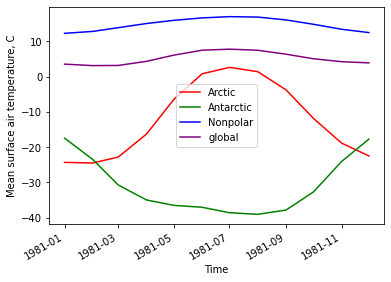

In [43]:
f, axs = plt.subplots()
arctic.t2m.plot(ax = axs, color='r', label = 'Arctic')
antarctic.t2m.plot(ax = axs, color='green', label = 'Antarctic')
nonpolar.t2m.plot(ax = axs, color='blue', label = 'Nonpolar')
global_temp.plot(ax = axs, color='purple', label = 'global')
axs.set_xlabel('Time')
axs.set_ylabel('Mean surface air temperature, C')
plt.legend()
#f.savefig('Mean_surface_air_temperature.svg', format='svg', dpi=1200)

<Figure size 1800x1200 with 0 Axes>

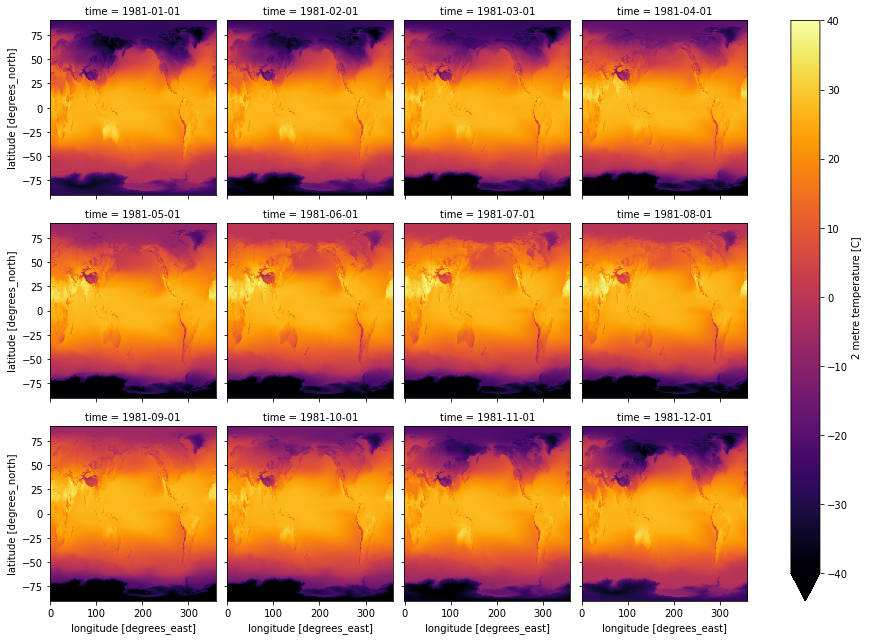

In [12]:
f = plt.figure(dpi=300)
temp_surface_air_image = t_clim_ds['t2m'].plot.imshow(x='longitude', y='latitude', col="time", col_wrap=4,vmax = 40, cmap='inferno');
temp_surface_air_image

In [13]:
#temp_surface_air_image.fig.savefig('Sea_surface_air_temperature.svg', format='svg', dpi=1200)

base_1 = 'ESACCI-OC-L3S-CHLOR_A-MERGED-1D_DAILY_4km_GEO_PML_OCx-2020'
fn_list = ['02','03','04','05','06','07','08','09','10','11','12']
base_2 = '01-fv5.0.1.nc'
url_list = [base_1+fn+base_2 for fn in fn_list]

chlor = 'ESACCI-OC-L3S-CHLOR_A-MERGED-1D_DAILY_4km_GEO_PML_OCx-20200101-fv5.0.1.nc'
chlor_array = xr.open_dataset(chlor, chunks='auto')

for i in url_list:
    x = 'chlor_' + i
    x = xr.open_dataset(i, chunks='auto')
    chlor_array = xr.concat([chlor_array, x], dim="time")

chlor_array['chlor_a'].to_netcdf('/home/jovyan/labs/ocean_color/chlor.nc')

In [2]:
chlor_array = xr.open_dataset('/home/jovyan/labs/ocean_color/chlor.nc', chunks='auto')

<Figure size 1500x6000 with 0 Axes>

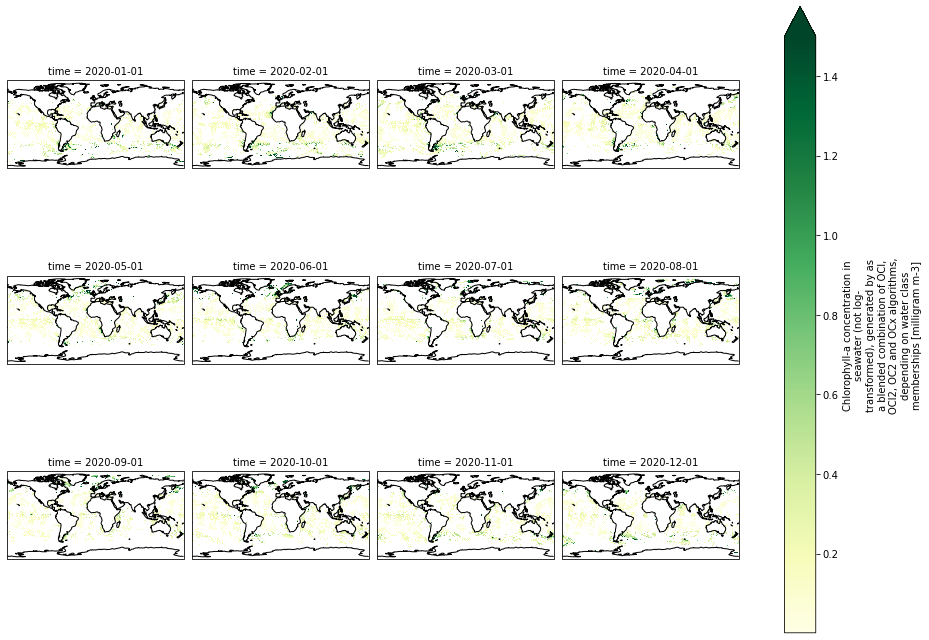

In [4]:
f = plt.figure(dpi=300,figsize=(5,20))
cg = chlor_array['chlor_a'].plot.imshow(x="lon", y="lat", vmax = 1.5,col = 'time', cmap='YlGn',col_wrap=4,subplot_kws=dict(projection=ccrs.PlateCarree()),transform=ccrs.PlateCarree())
for ax in cg.axes.flat:
    #ax.size(5,10)
    #ax.set_figsize(5,10)
    ax.coastlines()

In [4]:
#cg.fig.savefig('Chlor_a_coastline.svg', format='svg', dpi=1200)

In [ ]:
for ax in cg.axes.flat:
    ax.size(5,10)
    #ax.set_figsize(5,10)
    ax.coastlines()

<Figure size 1800x1200 with 0 Axes>

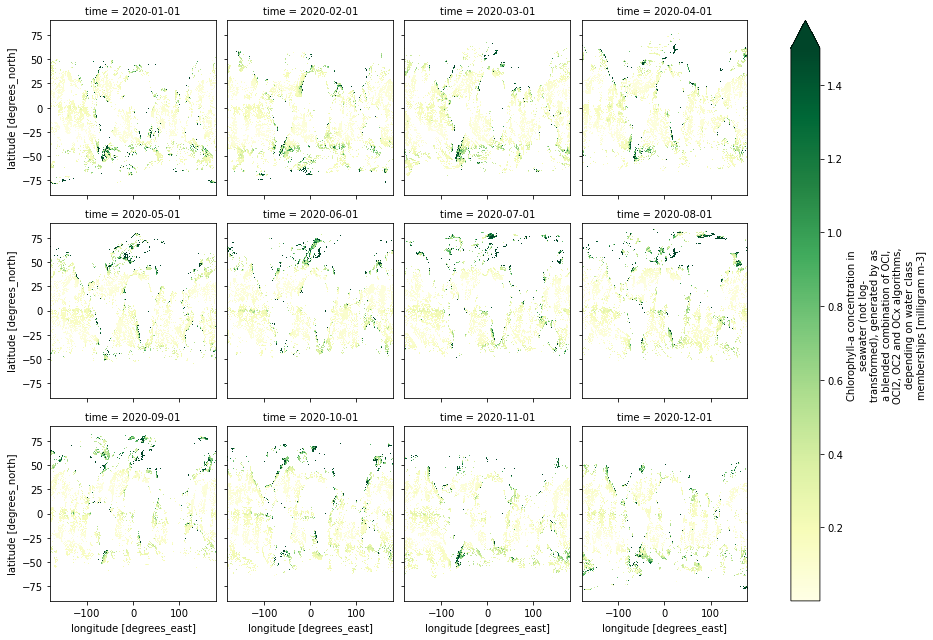

In [5]:
f = plt.figure(dpi=300)
#states_gdf_aea.plot(ax=ax, facecolor='none', edgecolor='k')
#ax = plt.axes(projection=ccrs.PlateCarree())
#ax.coastlines() 
fg = chlor_array['chlor_a'].plot.imshow(x="lon", y="lat", vmax = 1.5,col = 'time', cmap='YlGn',col_wrap=4)
#fg.axes[1].coastlines() 

In [6]:
#fg.fig.savefig('Chlor_a.svg', format='svg', dpi=1200)

In [3]:
polar_lat = 66.5
#arctic_idx = slice(polar_lat,90)
arctic_idx = (chlor_array['lat'] >= polar_lat)
antarctic_idx = (chlor_array['lat'] <= -polar_lat)
nonpolar_idx = (chlor_array['lat'] < polar_lat) & (chlor_array['lat'] > -polar_lat)

In [13]:
arctic_chlor = chlor_array.where(arctic_idx).mean(dim=('lat', 'lon'), skipna=True)
antarctic_chlor = chlor_array.where(antarctic_idx).mean(dim=('lat', 'lon'), skipna=True)
nonpolar_chlor = chlor_array.where(nonpolar_idx).mean(dim=('lat', 'lon'), skipna=True)
global_chlor = chlor_array.chlor_a.mean(dim=('lat', 'lon'), skipna=True)

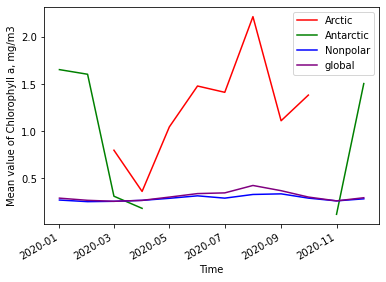

In [11]:
f, axs = plt.subplots()
arctic_chlor.chlor_a.plot(ax = axs, color='r', label = 'Arctic')
antarctic_chlor.chlor_a.plot(ax = axs, color='green', label = 'Antarctic')
nonpolar_chlor.chlor_a.plot(ax = axs, color='blue', label = 'Nonpolar')
global_chlor.plot(ax = axs, color='purple', label = 'global')
axs.set_xlabel('Time')
axs.set_ylabel('Mean value of Chlorophyll a, mg/m3')
plt.legend()


In [ ]:
#f.savefig('Mean_chlorophyll_a.svg', format='svg', dpi=1200)

In [29]:
import numpy.ma as ma

In [120]:
temperature = arctic.t2m.values
chlora = arctic_chlor.chlor_a.values
chlora_nna = ma.masked_invalid(chlora)
corr_air_chlora = ma.corrcoef(temperature, chlora_nna)

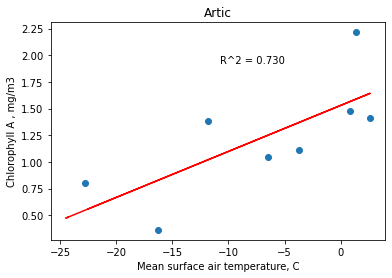

In [122]:
plt.scatter(x=temperature, y=chlora_nna)
m, b = ma.polyfit(temperature, chlora_nna, 1)

plt.plot(temperature, m*temperature + b, color ='red')
plt.xlabel('Mean surface air temperature, C')
plt.ylabel('Chlorophyll A , mg/m3')
plt.annotate("R^2 = {:.3f}".format(corr_air_chlora[0,1]), xy=(-5, 2),horizontalalignment='right', verticalalignment='top');
plt.title('Artic')
#plt.savefig('Corr_air_chlorA.svg', format='svg', dpi=1200)

In [123]:
temperature = antarctic.t2m.values
chlora = antarctic_chlor.chlor_a.values
chlora_nna = ma.masked_invalid(chlora)
corr_air_chlora = ma.corrcoef(temperature, chlora_nna)

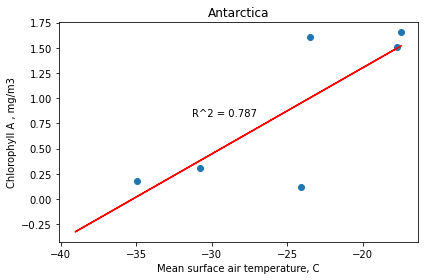

In [124]:
plt.scatter(x=temperature, y=chlora_nna)
m, b = ma.polyfit(temperature, chlora_nna, 1)

plt.plot(temperature, m*temperature + b, color ='red')
plt.xlabel('Mean surface air temperature, C')
plt.ylabel('Chlorophyll A , mg/m3')
#plt.annotate(f'R^2 = {corr_air_chlora[0,1]}',xy=(-27, 0))
plt.annotate("R^2 = {:.3f}".format(corr_air_chlora[0,1]), xy=(-27, 0.9),horizontalalignment='right', verticalalignment='top');
plt.title('Antarctica')
plt.tight_layout()
plt.savefig('Corr_air_chlorA_Antarctica.svg', format='svg', dpi=1200)

In [45]:
temperature = arctic_temp.sst.values
chlora = arctic_chlor.chlor_a.values
chlora[7] = 'nan'
chlora_nna = ma.masked_invalid(chlora)
corr_air_chlora = ma.corrcoef(temperature, chlora_nna)

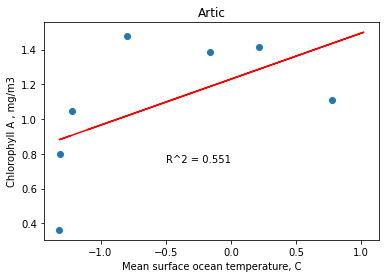

In [47]:
plt.scatter(x=temperature, y=chlora_nna)
m, b = ma.polyfit(temperature, chlora_nna, 1)

plt.plot(temperature, m*temperature + b, color ='red')
plt.xlabel('Mean surface ocean temperature, C')
plt.ylabel('Chlorophyll A , mg/m3')
plt.annotate("R^2 = {:.3f}".format(corr_air_chlora[0,1]), xy=(0, 0.8),horizontalalignment='right', verticalalignment='top');
plt.title('Artic')
#plt.savefig('Artic_Chlorophyll_surface_temp.svg', format='svg', dpi=1200)

In [ ]:
temperature = nonpolar.t2m.values
chlora = nonpolar_chlor.chlor_a.values
chlora_nna = ma.masked_invalid(chlora)
corr_air_chlora = ma.corrcoef(temperature, chlora_nna)

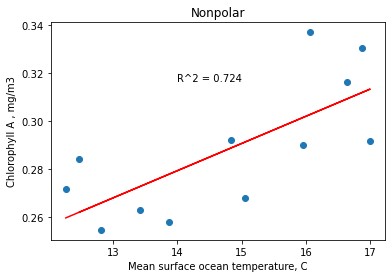

In [52]:
plt.scatter(x=temperature, y=chlora_nna)
m, b = ma.polyfit(temperature, chlora_nna, 1)

plt.plot(temperature, m*temperature + b, color ='red')
plt.xlabel('Mean surface ocean temperature, C')
plt.ylabel('Chlorophyll A , mg/m3')
plt.annotate("R^2 = {:.3f}".format(corr_air_chlora[0,1]), xy=(15, 0.32),horizontalalignment='right', verticalalignment='top');
plt.title('Nonpolar')
#plt.savefig('Nonpolar_Chlorophyll_air_temp.svg', format='svg', dpi=1200)

In [ ]:
temperature = global_temp.values
chlora = global_chlor.values
chlora_nna = ma.masked_invalid(chlora)
corr_air_chlora = ma.corrcoef(temperature, chlora_nna)

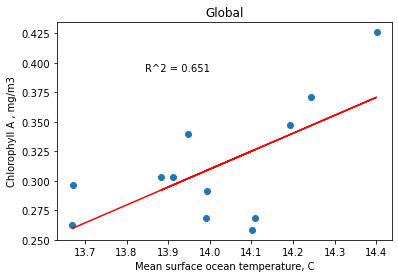

In [57]:
plt.scatter(x=temperature, y=chlora_nna)
m, b = ma.polyfit(temperature, chlora_nna, 1)

plt.plot(temperature, m*temperature + b, color ='red')
plt.xlabel('Mean surface ocean temperature, C')
plt.ylabel('Chlorophyll A , mg/m3')
plt.annotate("R^2 = {:.3f}".format(corr_air_chlora[0,1]), xy=(14, 0.4),horizontalalignment='right', verticalalignment='top');
plt.title('Global')
#plt.savefig('Global_Chlorophyll_air_temp.svg', format='svg', dpi=1200)

In [ ]:
arctic_temp.sst.values.plot()

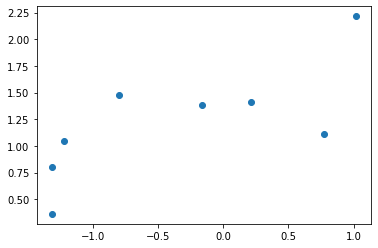

In [49]:

plt.scatter(x=arctic_temp.sst.values, y=arctic_chlor.chlor_a.values)


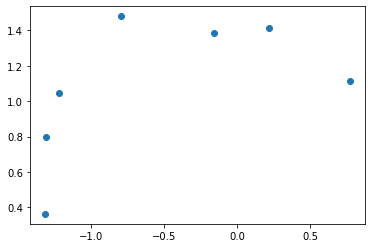

In [62]:
plt.scatter(x=arctic_temp.sst.values, y=chlor_arctic)

In [57]:
chlor_arctic = arctic_chlor.chlor_a.values

In [50]:
chlor_arctic = np.where(chlor_arctic>2,'nan',chlor_arctic)

In [56]:
arctic_temp.sst.values

array([-1.2305775 , -1.2716329 , -1.3131313 , -1.3158872 , -1.2194979 ,
       -0.79718447,  0.21667093,  1.0200187 ,  0.773465  , -0.16193312,
       -0.8760426 , -1.095134  ], dtype=float32)

In [59]:
chlor_arctic[7] = 'nan'

In [60]:
chlor_arctic

array([       nan,        nan, 0.7996661 , 0.36271018, 1.0468342 ,
       1.4801136 , 1.4132587 ,        nan, 1.1118624 , 1.3839748 ,
              nan,        nan], dtype=float32)

In [61]:
ma.corrcoef(arctic_temp.sst.values, ma.masked_invalid(chlor_arctic))

masked_array(
  data=[[1.0, 0.5513490671192348],
        [0.5513490671192348, 1.0]],
  mask=[[False, False],
        [False, False]],
  fill_value=1e+20)

In [15]:
np.corrcoef(arctic_chlor.chlor_a.values, arctic_temp.sst.values)

array([[nan, nan],
       [nan,  1.]])

In [68]:
arctic_chlor = arctic_chlor.chunk(chunks=12)

In [71]:
arctic_chlor

<xarray.Dataset>
Dimensions:  (time: 12)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-01 2020-02-01 ... 2020-12-01
Data variables:
    chlor_a  (time) float32 dask.array<chunksize=(12,), meta=np.ndarray>

In [76]:
arctic_temp.sst.values

array([-1.2305775 , -1.2716329 , -1.3131313 , -1.3158872 , -1.2194979 ,
       -0.79718447,  0.21667093,  1.0200187 ,  0.773465  , -0.16193312,
       -0.8760426 , -1.095134  ], dtype=float32)

In [69]:
arctic_temp = arctic_temp.chunk(chunks=12)

In [19]:
import hvplot.xarray 

In [ ]:
chlor_array.hvplot(x="longitude", y="latitude", groupby='time', width=500,cmap = 'inferno')

In [22]:
temp_hv = temp.hvplot(x="longitude", y="latitude", groupby='time', width=500,cmap = 'inferno')

In [26]:
temp.hvplot(x="longitude", y="latitude", groupby='time', width=500,cmap = 'inferno')

:DynamicMap   [time]
   :Image   [longitude,latitude]   (sst)

In [23]:
hvplot.save(temp_hv, 'sea_surface_temperature.html')

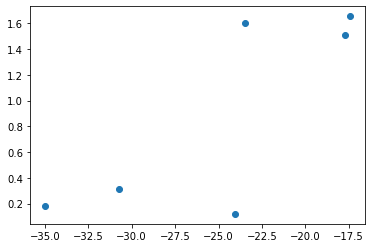

In [31]:
plt.scatter(x=antarctic.t2m.values, y=antarctic_chlor.chlor_a.values)

In [32]:
t_clim_ds

<xarray.Dataset>
Dimensions:    (time: 12, latitude: 721, longitude: 1440)
Coordinates:
  * time       (time) datetime64[ns] 1981-01-01 1981-02-01 ... 1981-12-01
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables:
    t2m        (time, latitude, longitude) float32 -25.67 -25.67 ... -28.23
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2022-02-28T07:58 GRIB to CDM+CF via cfgrib-0.9.1...

In [1]:
from argopy import DataFetcher as ArgoDataFetcher

In [ ]:
arctic.t2m